<a href="https://colab.research.google.com/github/tkaufm4/3/blob/master/Lab7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import numpy as np
import scipy 
import scipy.linalg
import scipy.sparse
import scipy.sparse.linalg
import matplotlib; matplotlib.use('Qt5Agg')
import matplotlib.pylab as plt
import time
from math import sinh

In [0]:
k = 10**7*10**-3*10**-12 #Permiability in m^2 (10 times higher than previously given)
mu = 1.0 #viscocity of water in Pa-s
por = 0.4 #porosity for a standard sand
cf = 4.6*10**-10 #fluid compressibility for water
cpor = 10**-7 #porous media compressibility for sand
ct = cf+cpor #total compressibility
C = k/(por*mu*ct) #diffusion coefficient

L = 1000 #1 Kilometer reservoir
n = 16
P0 = 6.895*10**6 #1000psi in Pa Reservoir Pressure
P1s = 5.55*10**6 #800psi in Pa Reservoir Pressure
P2s = 5.55*10**6 #800psi in Pa Bottom hole well pressure
dx = L/n
t_final = 1*30*24*60*60 #one month in seconds
dt = 3600 

x = np.linspace(dx/2, L-dx/2, n)
P = np.ones(n)*P0
dPdt = np.empty(n)

t = np.arange(0,t_final, dt)

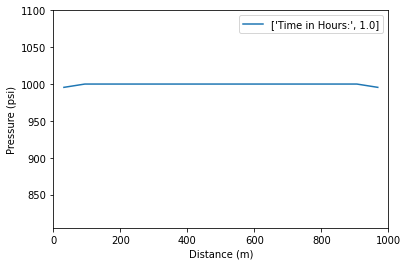

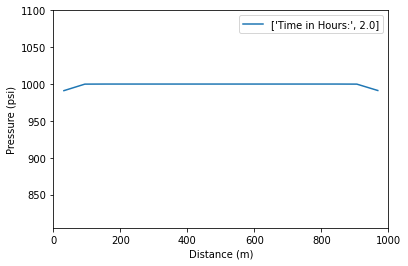

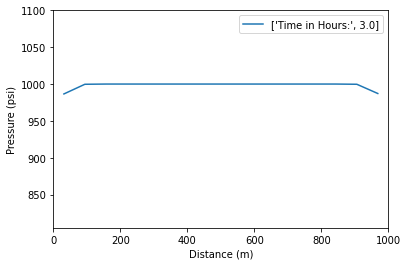

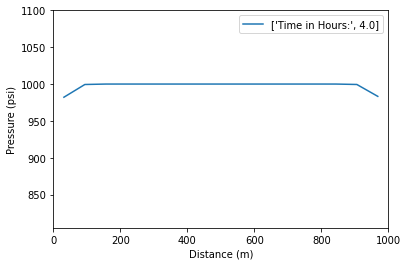

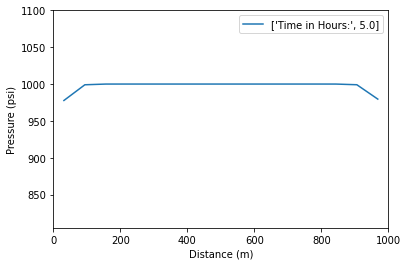

...

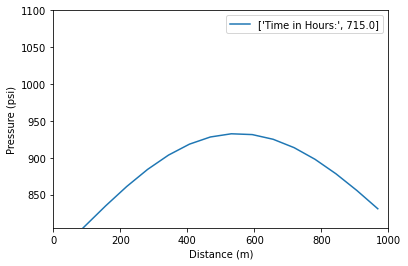

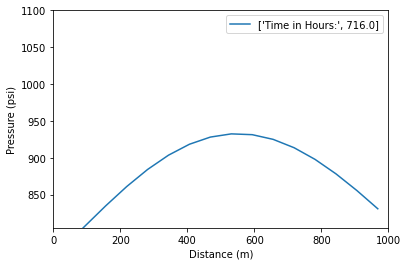

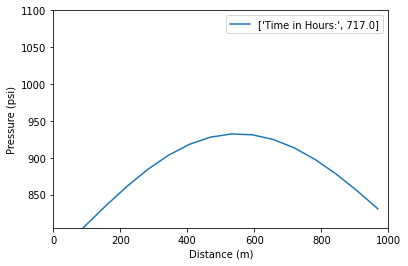

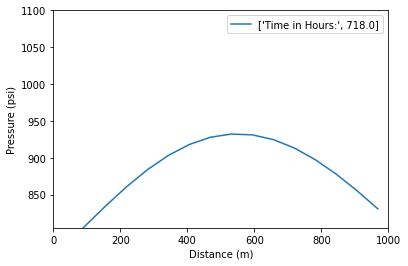

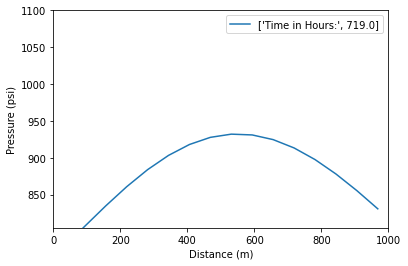

In [7]:
for j in range(1,len(t)):
    plt.clf()
    for i in range(1,n-1):
        dPdt[i] = C*(-(P[i]-P[i-1])/dx**2+(P[i+1]-P[i])/dx**2)
    #dPdt[0] = dPdt[1] #reflective boundary condition 
    dPdt[0] = C*(-(P[0]-P1s)/dx**2+(P[i+1]-P[i])/dx**2)
    dPdt[n-1] = C*(-(P[n-1]-P[n-2])/dx**2+(P2s-P[n-1])/dx**2)
    P = P + dPdt*dt
    plt.figure(1)
    plt.plot(x,P/6894.76)
    plt.axis([0,L,5.55*10**6/6894.76,1.1*(6.895*10**6/6894.76)])
    plt.xlabel('Distance (m)')
    plt.ylabel('Pressure (psi)')
    time = ["Time in Hours:", round(t[j]/60/60,0)]
    plt.legend([time])
    plt.show()
    plt.pause(0.1)